# Neural Network Language Model

In [417]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
%matplotlib inline

In [418]:
# read in all the words
words = open('names.txt', 'r').read().splitlines()
words[:8]

['emma', 'olivia', 'ava', 'isabella', 'sophia', 'charlotte', 'mia', 'amelia']

In [419]:
len(words)

32033

In [420]:
# build the vocabulary of characters and mappings to/from integers
chars = sorted(list(set(''.join(words))))
stoi = {s : i+1 for i, s in enumerate(chars)}
stoi['.'] = 0
itos = {i:s for s, i in stoi.items()}
print(itos)

{1: 'a', 2: 'b', 3: 'c', 4: 'd', 5: 'e', 6: 'f', 7: 'g', 8: 'h', 9: 'i', 10: 'j', 11: 'k', 12: 'l', 13: 'm', 14: 'n', 15: 'o', 16: 'p', 17: 'q', 18: 'r', 19: 's', 20: 't', 21: 'u', 22: 'v', 23: 'w', 24: 'x', 25: 'y', 26: 'z', 0: '.'}


In [421]:
# build the dataset

block_size = 3 # context-length: how many characters do we take to predict the next one?
X, Y = [], []

for w in words:
    print(w)
    context = [0] * block_size
    for ch in w + '.':
        ix = stoi[ch]
        X.append(context)
        Y.append(ix)
        print(''.join(itos[i] for i in context), '--->', itos[ix])
        context = context[1:] + [ix] # crop and append    
print(X)
print(Y)
X = torch.tensor(X)
Y = torch.tensor(Y)

emma
... ---> e
..e ---> m
.em ---> m
emm ---> a
mma ---> .
olivia
... ---> o
..o ---> l
.ol ---> i
oli ---> v
liv ---> i
ivi ---> a
via ---> .
ava
... ---> a
..a ---> v
.av ---> a
ava ---> .
isabella
... ---> i
..i ---> s
.is ---> a
isa ---> b
sab ---> e
abe ---> l
bel ---> l
ell ---> a
lla ---> .
sophia
... ---> s
..s ---> o
.so ---> p
sop ---> h
oph ---> i
phi ---> a
hia ---> .
charlotte
... ---> c
..c ---> h
.ch ---> a
cha ---> r
har ---> l
arl ---> o
rlo ---> t
lot ---> t
ott ---> e
tte ---> .
mia
... ---> m
..m ---> i
.mi ---> a
mia ---> .
amelia
... ---> a
..a ---> m
.am ---> e
ame ---> l
mel ---> i
eli ---> a
lia ---> .
harper
... ---> h
..h ---> a
.ha ---> r
har ---> p
arp ---> e
rpe ---> r
per ---> .
evelyn
... ---> e
..e ---> v
.ev ---> e
eve ---> l
vel ---> y
ely ---> n
lyn ---> .
abigail
... ---> a
..a ---> b
.ab ---> i
abi ---> g
big ---> a
iga ---> i
gai ---> l
ail ---> .
emily
... ---> e
..e ---> m
.em ---> i
emi ---> l
mil ---> y
ily ---> .
elizabeth
... ---> e
..e ---

In [422]:
X.shape, X.dtype, Y.shape, Y.dtype

(torch.Size([228146, 3]), torch.int64, torch.Size([228146]), torch.int64)

In [423]:
# build dataset

def build_dataset(words):
    
    block_size = 3 # context-length: how many characters do we take to predict the next one?
    X, Y = [], []

    for w in words:
        context = [0] * block_size
        for ch in w + '.':
            ix = stoi[ch]
            X.append(context)
            Y.append(ix)
            context = context[1:] + [ix] # crop and append    
   
    X = torch.tensor(X)
    Y = torch.tensor(Y)
    print(X.shape)
    print(Y.shape)
    return X, Y
    
# Build Train, Validation/dev and test sets --> 80, 10, 10
import random
random.seed(42)
random.shuffle(words)
n1 = int(0.8*len(words))
n2 = int(0.9*len(words))

Xtr, Ytr = build_dataset(words[:n1])
Xdev, Ydev = build_dataset(words[n1:n2])
Xte, Yte = build_dataset(words[n2:])

torch.Size([182625, 3])
torch.Size([182625])
torch.Size([22655, 3])
torch.Size([22655])
torch.Size([22866, 3])
torch.Size([22866])


In [424]:
# implementing the embedding lookup table
g = torch.Generator().manual_seed(2147483647)
C = torch.randn((27, 2), generator=g) # 2 dimensional embedding for each character

In [425]:
emb = C[X] # replaces each value by its corresponding embedding in C
emb.shape

torch.Size([228146, 3, 2])

In [426]:
W1 = torch.randn((6, 100), generator=g) # (3 x 2) = 6 inputs and 100 units/neurons
b1 = torch.randn(100, generator=g) 

In [ ]:
# We need emb(32, 3, 2) @ W1(6, 100) --> we need to make dimensions same for dot product --> (32, 6)  
# Ways to concatenate
# 1. Hard coded 
torch.cat([emb[:, 0, :], emb[:, 1, :], emb[:, 2, :]], 1)

# 2. unbind methed
torch.cat(torch.unbind(emb, 1), 1) # less efficient as new tensor is created in memory with whole new storage

# 3. torch.view()
emb.view(-1, 6) 
# most efficient as in each tensor there is an underlying storage() which is just the numbers stored as a 1D vector
# Using view we manipulate some of the attributes (storage offset, strides and shapes) of that tensor that dictate 
# how this 1D sequence is interpreted to be an n-dim vector

In [427]:
# Optimal Method -> torch.view()
h = torch.tanh(emb.view(-1, 6) @ W1 + b1) # -1 is used as it tells pytorch that it has to infer the dimension

In [428]:
print(h.shape)
print(h)

torch.Size([228146, 100])
tensor([[-0.9348,  1.0000,  0.9258,  ...,  0.9786, -0.1926,  0.9515],
        [ 0.2797,  0.9997,  0.7675,  ...,  0.9929,  0.9992,  0.9981],
        [-0.9960,  1.0000, -0.8694,  ..., -0.5159, -1.0000, -0.0069],
        ...,
        [-0.4849,  0.9972, -0.6418,  ..., -0.9641,  0.9996,  0.9873],
        [-0.9318,  0.9926, -0.9841,  ..., -0.8989, -0.9938,  0.5930],
        [-0.9736,  0.3844, -0.8744,  ..., -0.5093,  0.9998, -0.9975]])


In [429]:
W2 = torch.randn((100, 27), generator=g)
b2 = torch.randn(27, generator=g)

In [430]:
logits = h @ W2 + b2

In [431]:
print(logits.shape)
print(logits)

torch.Size([228146, 27])
tensor([[  2.0191,  -0.5013,  13.3706,  ...,  10.2469,   2.8311,   9.2402],
        [ -6.9784,   0.8382,   9.4671,  ...,   5.7656,   4.1368,  12.4966],
        [  4.1821,  -3.6009,  17.0966,  ...,   6.5224, -10.4342,  -1.5205],
        ...,
        [ -5.8335,   0.0515,   0.8027,  ..., -10.3916,  -2.5706,  -1.6157],
        [ -1.6369,  -7.4065,   8.9311,  ...,  -5.8148,  -9.0827,   0.6466],
        [  1.0493, -15.2429,  -3.2347,  ..., -12.1904,   8.7967, -14.6360]])


In [432]:
# implementing negative log likelihood loss
counts = logits.exp()
prob = counts/counts.sum(1, keepdim=True)
loss = -prob[torch.arange(X.shape[0]), Y].log().mean()
print('Manual loss:', loss)
# this method is inefficient as new tensors are created at every step
# so we use cross_entropy function -> pytorch will cluster up all these operations and have fused kernels that
# very efficiently evaluate these clustered mathematical operations
# Secondly backward pass is more efficient
# thirdly things are numerically well behaved as we dont encounter nan/inf 
loss = F.cross_entropy(logits, Y)
print('using cross_entropy:', loss)

Manual loss: tensor(19.5052)
using cross_entropy: tensor(19.5052)


In [433]:
parameters = [C, W1, b1, W2, b2]
for p in parameters:
    p.requires_grad = True
print('Total parameters:', sum(p.nelement() for p in parameters))

Total parameters: 3481


In [434]:
# ranges of learning rates to check 
lre = torch.linspace(-3, 0, 1000)
lrs = 10 ** lre

In [445]:
lri = []
lossi = []

for epochs in range(10000):
    
    # mini-batch construct
    ix = torch.randint(0, Xtr.shape[0], (32,)) # m = 32
    
    #forward pass
    emb = C[Xtr[ix]] # (32, 3, 2)
    h = torch.tanh(emb.view(-1, 6) @ W1 + b1) # (32, 100)
    logits = h @ W2 + b2 # (32, 27)
    loss = F.cross_entropy(logits, Ytr[ix])
    print(loss.item())
    # backward pass
    for p in parameters:
        p.grad = None
    loss.backward()
    
    lr = 0.01
    #update
    for p in parameters:
        p.data += -lr * p.grad
    
    # track stats
    # lri.append(lre[epochs])
    # lossi.append(loss.item())
        


2.361414909362793
2.254730463027954
2.2692203521728516
2.549712657928467
2.740858316421509
2.553461790084839
2.5456559658050537
2.314143180847168
2.4076783657073975
2.19050669670105
2.2672417163848877
2.4587645530700684
2.102384328842163
2.445727825164795
2.17533278465271
2.26727294921875
2.30845308303833
2.0812368392944336
2.28837513923645
2.1680867671966553
2.308436155319214
2.1682372093200684
2.455698251724243
2.203329563140869
2.276892900466919
2.409062623977661
2.6444387435913086
2.699220657348633
2.112421751022339
2.3020286560058594
2.4103472232818604
2.4704558849334717
2.194462776184082
2.8827929496765137
2.448765277862549
1.9784870147705078
2.503156900405884
2.2272109985351562
2.3242576122283936
2.014707326889038
2.3870937824249268
2.5936872959136963
2.311446189880371
2.3596036434173584
2.52592134475708
2.359771251678467
2.79848575592041
2.4903860092163086
2.2059552669525146
1.914679765701294
2.7728285789489746
2.8243026733398438
2.4970803260803223
2.6656277179718018
2.46566390

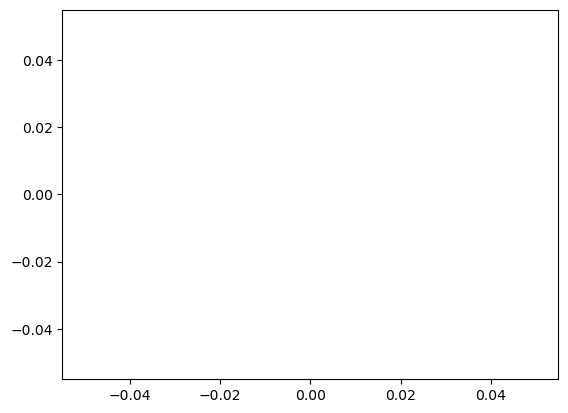

In [446]:
plt.plot(lri, lossi)

In [447]:
emb = C[Xdev] # (32, 3, 2)
h = torch.tanh(emb.view(-1, 6) @ W1 + b1) # (32, 100)
logits = h @ W2 + b2 # (32, 27)
loss = F.cross_entropy(logits, Ydev)
print(loss.item())

2.343522548675537


In [448]:
emb = C[Xtr] # (32, 3, 2)
h = torch.tanh(emb.view(-1, 6) @ W1 + b1) # (32, 100)
logits = h @ W2 + b2 # (32, 27)
loss = F.cross_entropy(logits, Ytr)
print(loss.item())

2.3435072898864746


We are underfitting right now as train error ~ dev error

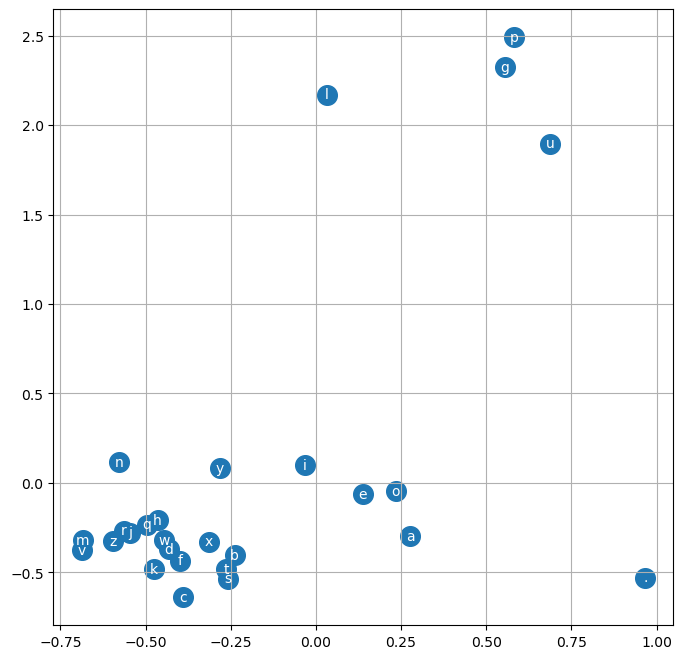

In [449]:
# visualize dimensions 0 and 1 of the embedding matrix C for all characters
plt.figure(figsize=(8,8))
plt.scatter(C[:,0].data, C[:,1].data, s=200)
for i in range(C.shape[0]):
    plt.text(C[i,0].item(), C[i,1].item(), itos[i], ha="center", va="center", color='white')
plt.grid('minor')

# Increasing Hidden Layer Size and Embedding Dimensions

In [450]:
Xtr.shape, Ytr.shape # dataset

(torch.Size([182625, 3]), torch.Size([182625]))

In [451]:
g = torch.Generator().manual_seed(214783647)
C = torch.randn((27, 10), generator=g)
W1 = torch.randn((30, 200), generator=g)
b1 = torch.randn(200, generator=g)
W2 = torch.randn((200, 27), generator=g)
b2 = torch.randn(27, generator=g)
parameters = [C, W1, b1, W2, b2]

In [452]:
for p in parameters:
    p.requires_grad = True
print('Total parameters:', sum(p.nelement() for p in parameters))

Total parameters: 11897


In [453]:
# ranges of learning rates to check 
lre = torch.linspace(-3, 0, 1000)
lrs = 10 ** lre

In [455]:
lri = []
lossi = []
steppi = []

for epochs in range(200000):
    
    # mini-batch construct
    ix = torch.randint(0, Xtr.shape[0], (32,)) # m = 32
    
    #forward pass
    emb = C[Xtr[ix]] # (32, 3, 2)
    h = torch.tanh(emb.view(-1, 30) @ W1 + b1) # (32, 100)
    logits = h @ W2 + b2 # (32, 27)
    loss = F.cross_entropy(logits, Ytr[ix])
    print(loss.item())
    # backward pass
    for p in parameters:
        p.grad = None
    loss.backward()
    
    #update
    lr = 0.1 if epochs < 100000 else 0.01
    for p in parameters:
        p.data += -lr * p.grad
    
    # track stats
    steppi.append(epochs)
    lossi.append(loss.log10().item())

4.315681457519531
4.034177303314209
3.144803285598755
3.6545684337615967
3.3268795013427734
4.496273994445801
3.2113161087036133
2.553122043609619
2.9603841304779053
3.9284489154815674
3.1701667308807373
2.90978741645813
3.8769962787628174
4.384778022766113
3.6512253284454346
3.902515172958374
4.010561466217041
2.8537545204162598
3.1079790592193604
3.625379800796509
3.5947184562683105
3.4324142932891846
3.853827953338623
3.507483720779419
2.9625778198242188
3.633540391921997
3.160768508911133
3.2031376361846924
3.170274496078491
4.361069679260254
3.246483087539673
4.0444159507751465
4.0772705078125
3.0987977981567383
3.5661401748657227
2.907879590988159
4.044036388397217
3.0549659729003906
3.0301053524017334
3.1732006072998047
3.6064157485961914
3.3962857723236084
4.393460750579834
3.0278818607330322
3.5092878341674805
3.6306371688842773
2.9760289192199707
3.3435168266296387
3.5227160453796387
3.1889395713806152
4.826571464538574
4.810322284698486
3.023820400238037
3.591499090194702
3.

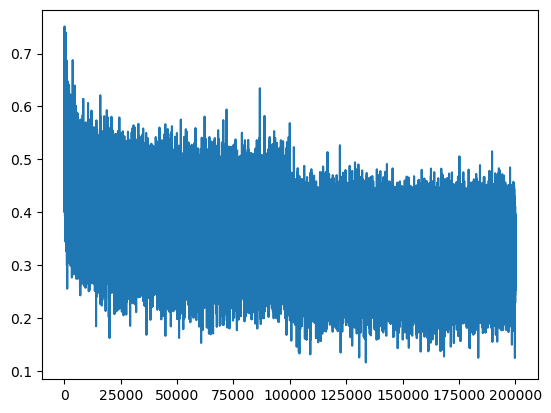

In [456]:
plt.plot(steppi, lossi)

In [457]:
emb = C[Xtr] # (32, 3, 2)
h = torch.tanh(emb.view(-1, 30) @ W1 + b1) # (32, 100)
logits = h @ W2 + b2 # (32, 27)
loss = F.cross_entropy(logits, Ytr)
print(loss.item())

2.126250743865967


In [458]:
emb = C[Xdev] # (32, 3, 2)
h = torch.tanh(emb.view(-1, 30) @ W1 + b1) # (32, 100)
logits = h @ W2 + b2 # (32, 27)
loss = F.cross_entropy(logits, Ydev)
print(loss.item())

2.1697561740875244


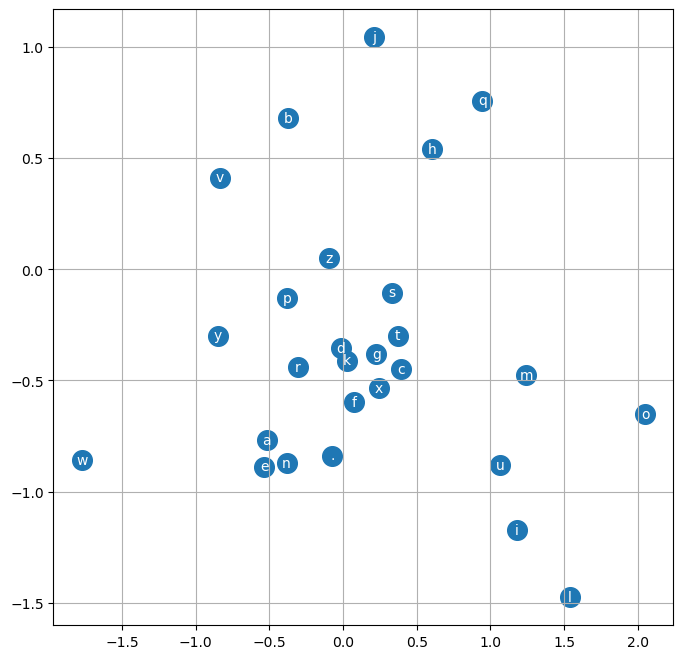

In [459]:
# visualize dimensions 0 and 1 of the embedding matrix C for all characters
plt.figure(figsize=(8,8))
plt.scatter(C[:,0].data, C[:,1].data, s=200)
for i in range(C.shape[0]):
    plt.text(C[i,0].item(), C[i,1].item(), itos[i], ha="center", va="center", color='white')
plt.grid('minor')